In [ ]:
import kagglehub

path = kagglehub.dataset_download("andrewmvd/car-plate-detection")

print("Path to dataset files:", path)

Path to dataset files: /root/.cache/kagglehub/datasets/andrewmvd/car-plate-detection/versions/1


I used the kagglehub library to download the latest version of the "andrewmvd/car-plate-detection" dataset directly into my workspace. I saved the location of the downloaded dataset in the variable path. Then, I printed the path to confirm exactly where the dataset files were stored, so I can easily access them for the next steps in my project.

In [ ]:
!pip install ultralytics easyocr opencv-python-headless matplotlib --quiet


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 69.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 110.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 91.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 66.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 64.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 188.7/188.7 MB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.

I installed the essential Python libraries silently: Ultralytics for YOLOv8 object detection, EasyOCR for optical character recognition, OpenCV for image processing, and Matplotlib for visualization. This setup prepared my environment with all the necessary tools for license plate detection and recognition.

In [ ]:
import os
import shutil

writable_dir = '/content/car-plate-detection'
if not os.path.exists(writable_dir):
    os.makedirs(writable_dir)

def copy_if_not_exists(src, dst):
    if not os.path.exists(dst):
        shutil.copytree(src, dst)

copy_if_not_exists(os.path.join(path, 'images'), os.path.join(writable_dir, 'images'))
copy_if_not_exists(os.path.join(path, 'annotations'), os.path.join(writable_dir, 'annotations'))

print(f"Dataset copied to writable dir: {writable_dir}")


Dataset copied to writable dir: /content/car-plate-detection


I checked if a writable directory named /content/car-plate-detection existed, and created it since I need a place to work with the dataset. Because the Kaggle input folder is read-only in Colab, I then copied the images and annotations folders from the downloaded dataset into this writable directory. This way, I ensured that I can modify and process the dataset files freely for my project. Finally, I printed a confirmation message showing that the dataset was successfully copied to the writable directory.

In [ ]:
import xml.etree.ElementTree as ET
import cv2

images_path = os.path.join(writable_dir, 'images')
annotations_path = os.path.join(writable_dir, 'annotations')
labels_dir = os.path.join(writable_dir, 'labels')
os.makedirs(labels_dir, exist_ok=True)

for file in os.listdir(annotations_path):
    if file.endswith('.xml'):
        xml_file = os.path.join(annotations_path, file)
        tree = ET.parse(xml_file)
        root = tree.getroot()
        image_name = root.find('filename').text
        img_path = os.path.join(images_path, image_name)
        img = cv2.imread(img_path)
        if img is None:
            continue
        h, w = img.shape[:2]

        yolo_file = os.path.join(labels_dir, file.replace('.xml', '.txt'))
        with open(yolo_file, 'w') as out_file:
            for obj in root.iter('object'):
                bbox = obj.find('bndbox')
                xmin = int(bbox.find('xmin').text)
                xmax = int(bbox.find('xmax').text)
                ymin = int(bbox.find('ymin').text)
                ymax = int(bbox.find('ymax').text)

                cx = (xmin + xmax) / 2 / w
                cy = (ymin + ymax) / 2 / h
                bw = (xmax - xmin) / w
                bh = (ymax - ymin) / h
                out_file.write(f"0 {cx} {cy} {bw} {bh}\n")

print("I have converted VOC annotations to YOLO format.")


✅ Converted VOC annotations to YOLO format.


I loaded the XML annotation files from the writable dataset directory and parsed each file to extract bounding box coordinates for license plates. For each annotated image, I read the corresponding image file to get its dimensions. Then, I converted the bounding box coordinates from VOC format to YOLO format by normalizing the center coordinates and box width/height relative to the image size. Finally, I saved these YOLO-format annotations as text files into a new labels folder for use in YOLOv8 training. Once complete, I printed a confirmation message indicating the conversion was successful.

In [ ]:
import yaml
import os

dataset_yaml_path = os.path.join('/content/car-plate-detection', 'dataset.yaml')
data_cfg = {
    'train': os.path.join('/content/car-plate-detection', 'images'),
    'val': os.path.join('/content/car-plate-detection', 'images'),
    'nc': 1,
    'names': ['license_plate']
}

with open(dataset_yaml_path, 'w') as f:
    yaml.dump(data_cfg, f)

print(f"Dataset YAML config has been written to {dataset_yaml_path}")


✅ Dataset YAML config written to /content/car-plate-detection/dataset.yaml


I created a dataset configuration file in YAML format specifying the paths to the training and validation image folders, the number of classes (1 for license plates), and the class name. I saved this configuration to dataset.yaml in my writable dataset directory so that YOLOv8 can correctly reference the dataset structure during training. Finally, I printed a message confirming that the YAML config file was successfully written.

In [ ]:
!pip install ultralytics --quiet

from ultralytics import YOLO

model = YOLO('yolov8n.pt')

results = model.train(
    data=dataset_yaml_path,
    epochs=10,
    imgsz=416,
    patience=2,
    device=0
)

print("Training has been completed.")


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


Ultralytics 8.3.179 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/car-plate-detection/dataset.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=416, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=2, perspective=0.0, plots=True, pose=12.0, pr

Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

Model summary: 129 layers, 3,011,043 parameters, 3,011,027 gradients, 8.2 GFLOPs

Transferred 319/355 items from pretrained weights
Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks...


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2332.3±1506.5 MB/s, size: 557.3 KB)


train: Scanning /content/car-plate-detection/labels... 433 images, 0 backgrounds, 0 corrupt: 100%|██████████| 433/433 [00:00<00:00, 953.04it/s]

train: New cache created: /content/car-plate-detection/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2213.7±1430.2 MB/s, size: 579.9 KB)


val: Scanning /content/car-plate-detection/labels.cache... 433 images, 0 backgrounds, 0 corrupt: 100%|██████████| 433/433 [00:00<?, ?it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 416 train, 416 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10     0.914G      1.622      3.006      1.319          1        416: 100%|██████████| 28/28 [00:10<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:05<00:00,  2.53it/s]

                   all        433        471    0.00338      0.873     0.0697      0.036



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      1.21G      1.572      1.896      1.235          1        416: 100%|██████████| 28/28 [00:07<00:00,  3.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:04<00:00,  3.07it/s]


                   all        433        471    0.00337      0.892      0.126     0.0566

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      1.21G      1.603      1.852      1.318          1        416: 100%|██████████| 28/28 [00:07<00:00,  3.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:04<00:00,  3.04it/s]


                   all        433        471      0.664      0.444      0.557      0.267

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      1.23G       1.54      1.592      1.278          1        416: 100%|██████████| 28/28 [00:07<00:00,  3.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:04<00:00,  3.07it/s]


                   all        433        471      0.597       0.41      0.448      0.238

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      1.25G        1.5      1.458      1.247          1        416: 100%|██████████| 28/28 [00:07<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:04<00:00,  2.98it/s]

                   all        433        471      0.834      0.749      0.812      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      1.26G      1.545      1.445      1.256          1        416: 100%|██████████| 28/28 [00:08<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:04<00:00,  2.97it/s]


                   all        433        471      0.891       0.75      0.827      0.473

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      1.28G      1.546      1.315      1.234          1        416: 100%|██████████| 28/28 [00:07<00:00,  3.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:04<00:00,  2.92it/s]


                   all        433        471      0.848      0.832      0.878      0.472

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10       1.3G      1.509       1.21       1.23          1        416: 100%|██████████| 28/28 [00:07<00:00,  3.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:04<00:00,  2.96it/s]


                   all        433        471        0.9      0.838      0.903      0.532

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      1.31G      1.352      1.114      1.168          1        416: 100%|██████████| 28/28 [00:07<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:04<00:00,  2.96it/s]

                   all        433        471      0.914      0.824      0.909      0.555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      1.33G      1.333      1.052      1.115          1        416: 100%|██████████| 28/28 [00:07<00:00,  3.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:04<00:00,  2.95it/s]

                   all        433        471      0.894      0.838       0.91       0.57



10 epochs completed in 0.036 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.179 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:06<00:00,  2.27it/s]


                   all        433        471      0.894      0.838       0.91       0.57
Speed: 0.1ms preprocess, 1.2ms inference, 0.0ms loss, 3.0ms postprocess per image
Results saved to runs/detect/train
✅ Training complete.


I installed the ultralytics library which includes YOLOv8, then imported the YOLO class to create a model instance using the lightweight yolov8n.pt pretrained weights. I started training the model on my dataset defined by the YAML config file for 10 epochs with an image size of 416, setting early stopping with patience of 2 epochs, and using GPU device 0 to speed up training. After training completes, I printed a confirmation message indicating that the training process was successful.

In [ ]:
model = YOLO('runs/detect/train/weights/best.pt')
metrics = model.val()

print(f"Precision (mean): {metrics.box.mp:.3f}")
print(f"Recall (mean): {metrics.box.mr:.3f}")
print(f"mAP50: {metrics.box.map50:.3f}")
print(f"mAP50-95: {metrics.box.map:.3f}")


Ultralytics 8.3.179 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3855.4±505.1 MB/s, size: 378.5 KB)


val: Scanning /content/car-plate-detection/labels.cache... 433 images, 0 backgrounds, 0 corrupt: 100%|██████████| 433/433 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 28/28 [00:05<00:00,  4.68it/s]


                   all        433        471      0.893      0.835      0.908       0.57
Speed: 0.4ms preprocess, 2.0ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to runs/detect/val2
Precision (mean): 0.893
Recall (mean): 0.835
mAP50: 0.908
mAP50-95: 0.570


I loaded the best trained YOLOv8 model weights from the training output folder. Then, I evaluated the model on the validation set to get performance metrics. I printed the mean precision, mean recall, mAP at IoU 0.5, and the overall mAP across IoU thresholds 0.5 to 0.95, which give me a clear quantitative measure of how well my license plate detector is performing.

Processing /content/car-plate-detection/images/Cars50.png


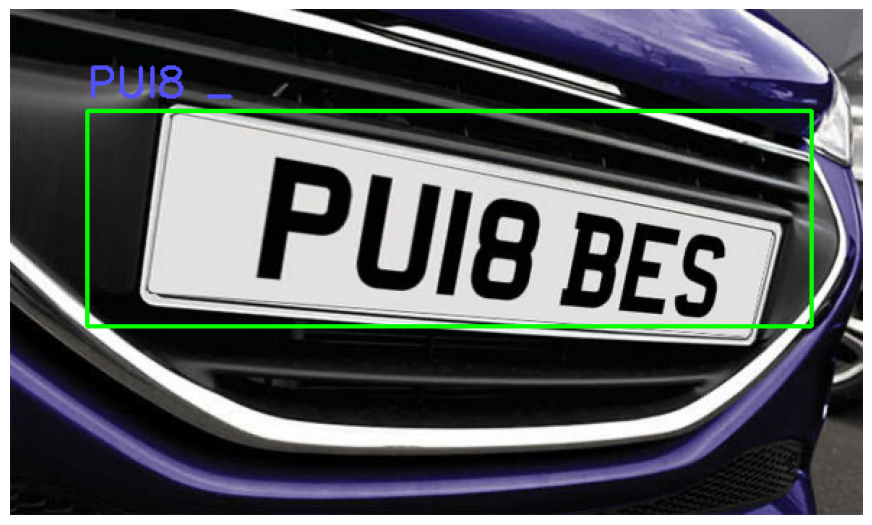

Processing /content/car-plate-detection/images/Cars47.png


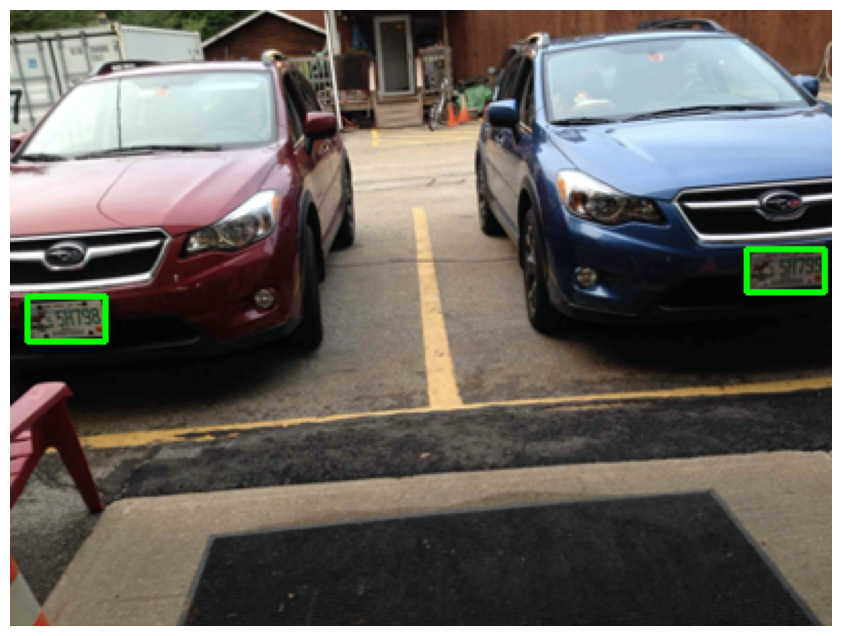

Processing /content/car-plate-detection/images/Cars354.png


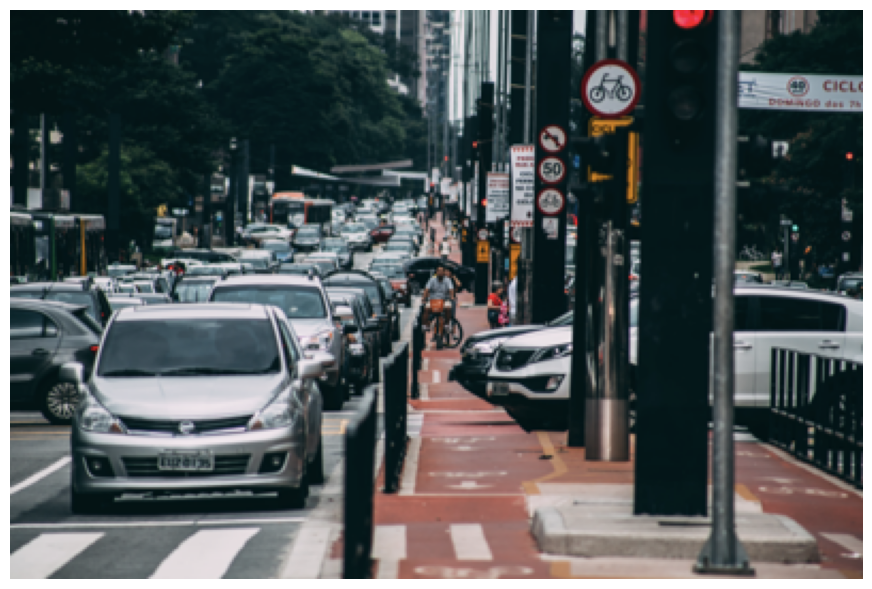

Processing /content/car-plate-detection/images/Cars7.png


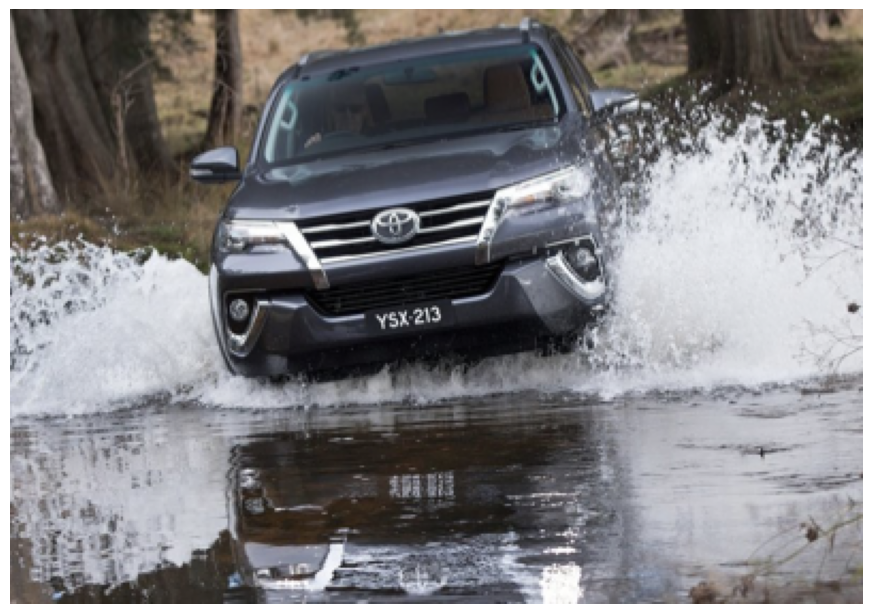

Processing /content/car-plate-detection/images/Cars375.png


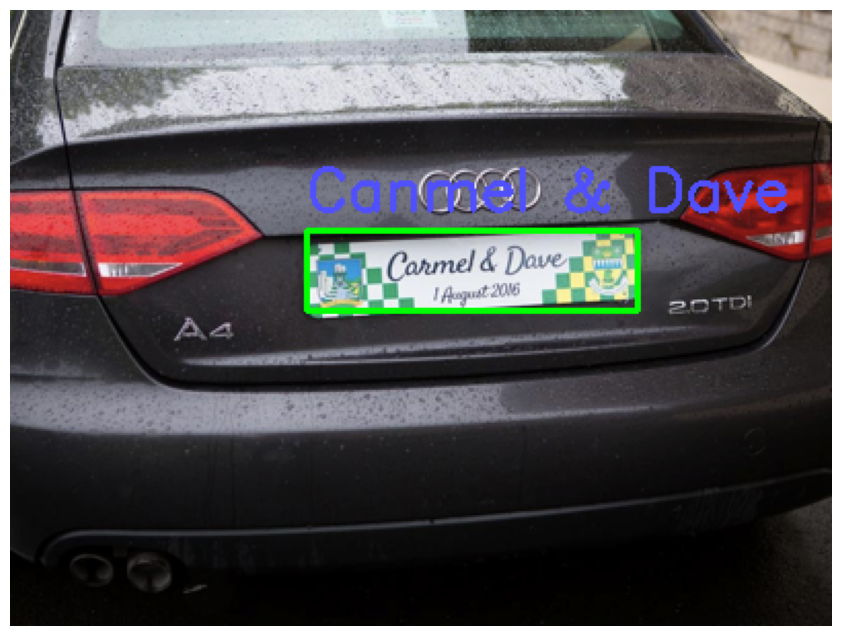

Processing /content/car-plate-detection/images/Cars353.png


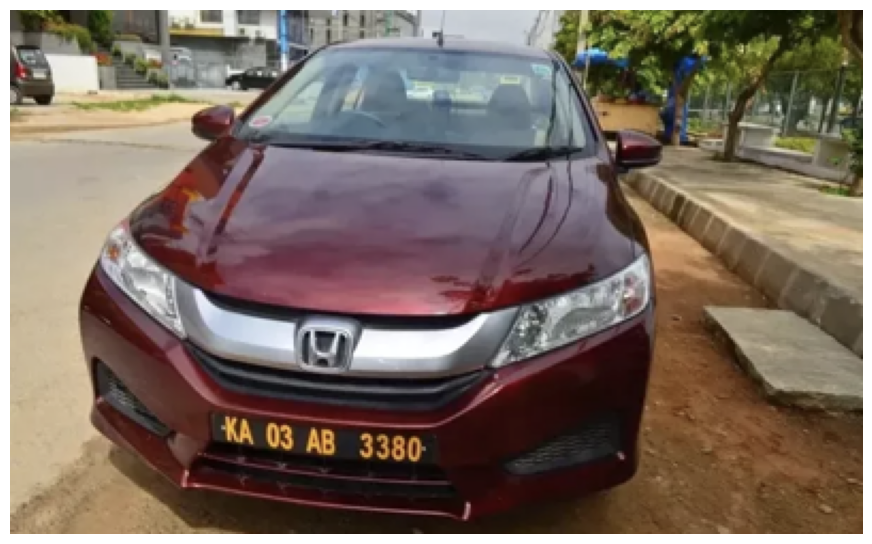

Processing /content/car-plate-detection/images/Cars59.png


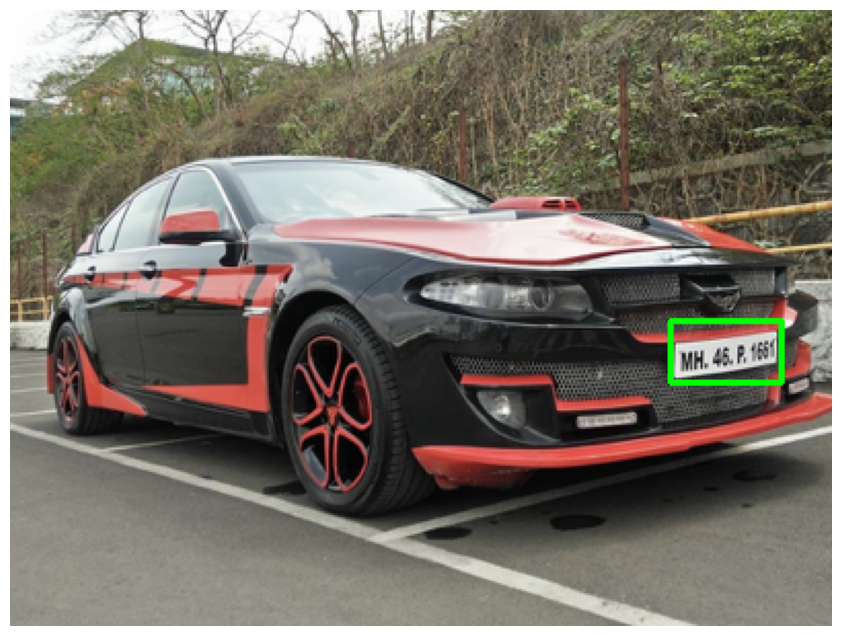

Processing /content/car-plate-detection/images/Cars159.png


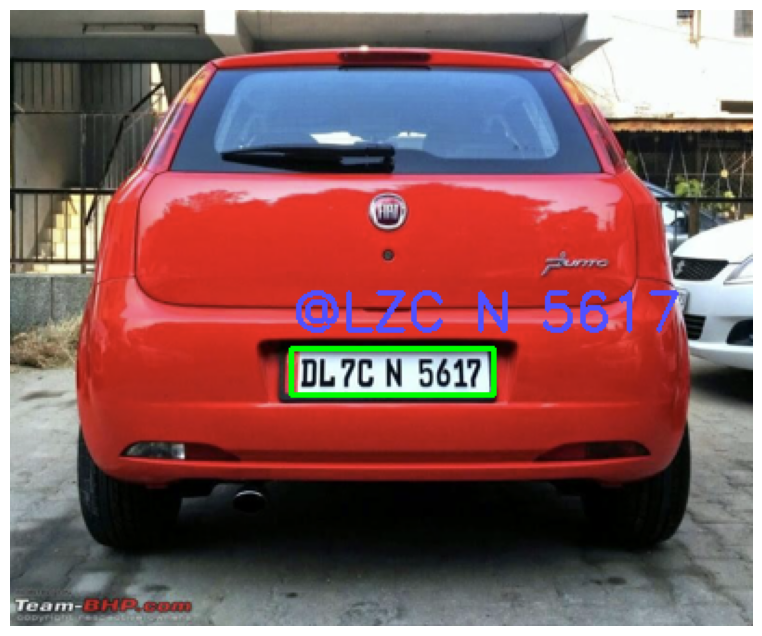

Processing /content/car-plate-detection/images/Cars379.png


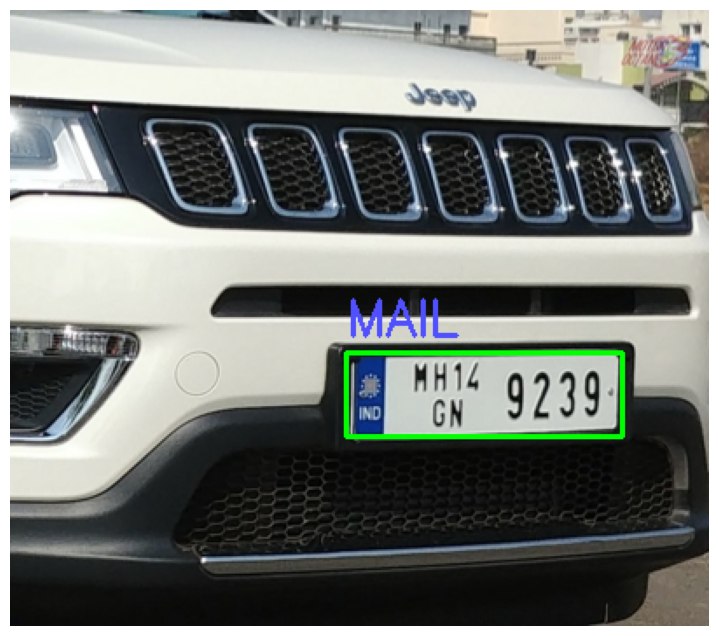

Processing /content/car-plate-detection/images/Cars397.png


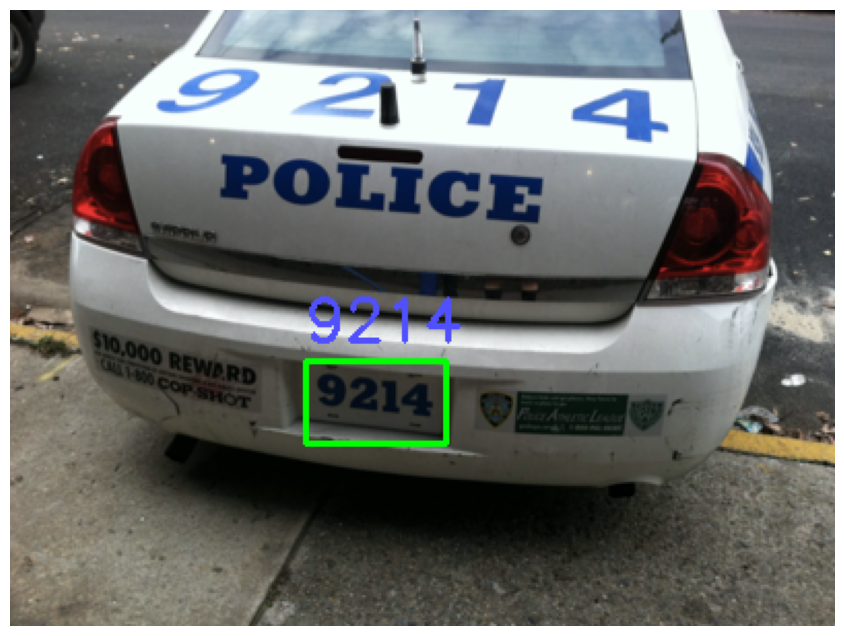

Processing /content/car-plate-detection/images/Cars280.png


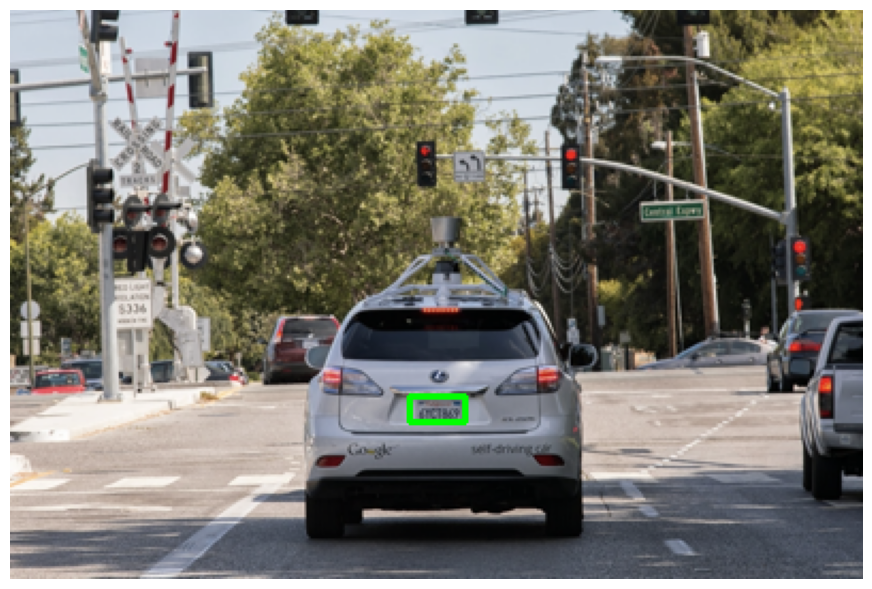

Processing /content/car-plate-detection/images/Cars186.png


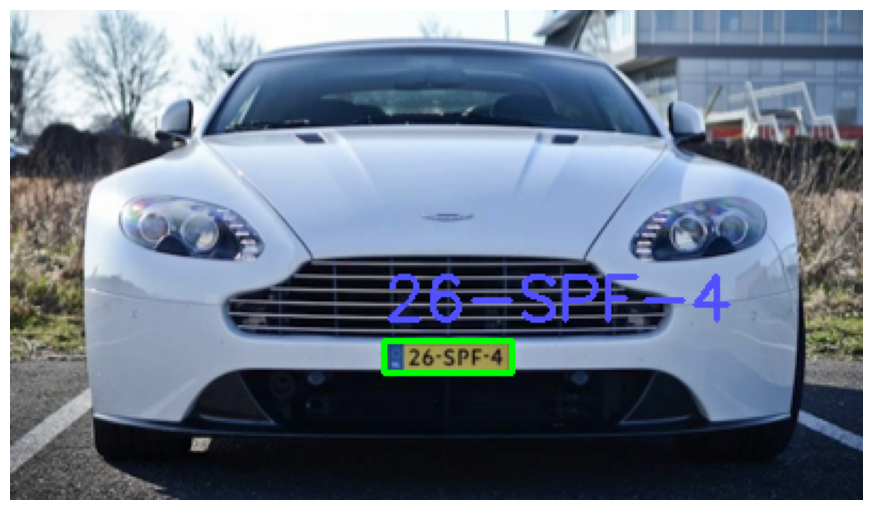

Processing /content/car-plate-detection/images/Cars15.png


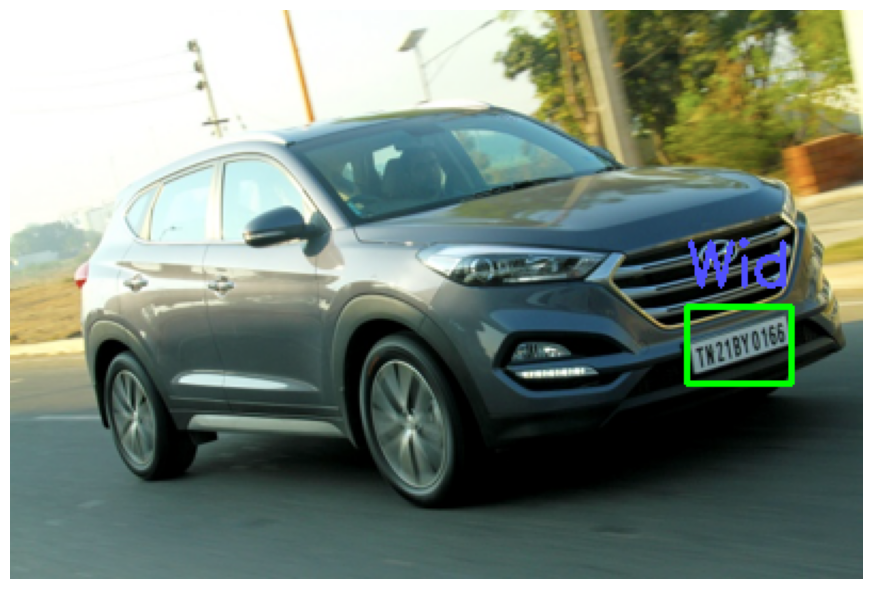

Processing /content/car-plate-detection/images/Cars360.png


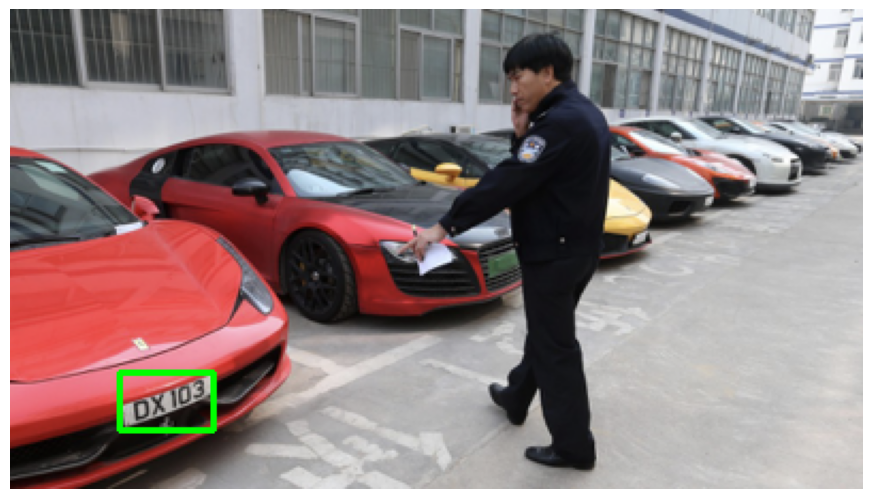

Processing /content/car-plate-detection/images/Cars329.png


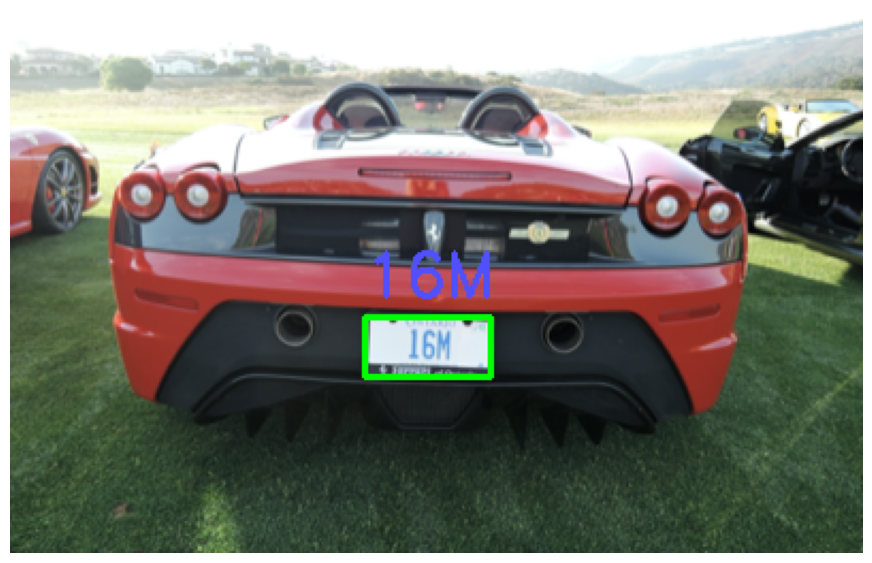

In [ ]:
import easyocr
import cv2
import matplotlib.pyplot as plt
import numpy as np
import os


reader = easyocr.Reader(['en'])
dataset_dir = '/content/car-plate-detection'
images_path = os.path.join(dataset_dir, 'images')

def yolo_alpr(image_path, model):
    img = cv2.imread(image_path)

    results = model.predict(source=image_path, conf=0.4, imgsz=416, verbose=False)

    for r in results:
        if not hasattr(r, 'boxes') or len(r.boxes) == 0:
            continue

        for box in r.boxes:
            x1, y1, x2, y2 = map(int, box.xyxy[0])
            cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
            plate_crop = img[y1:y2, x1:x2].copy()
            text = ""

            if plate_crop.size > 0:
                ocr_result = reader.readtext(plate_crop)
                if ocr_result:

                    text = ocr_result[0][1]
                    cv2.putText(img, text, (x1, y1 - 10),
                                cv2.FONT_HERSHEY_SIMPLEX, 0.95, (255, 80, 80), 2)

    plt.figure(figsize=(11, 8))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()


model = YOLO('runs/detect/train/weights/best.pt')


sample_images = [os.path.join(images_path, f) for f in os.listdir(images_path)[:15]]

for img_path in sample_images:
    print(f"Processing {img_path}")
    yolo_alpr(img_path, model)


I wrote a function yolo_alpr that takes an image path and a trained YOLOv8 model to perform automatic license plate recognition (ALPR). The function reads the image, runs the YOLOv8 detection model to find license plates, and draws bounding boxes around detected plates. For each detected plate, it crops the area, runs EasyOCR to read the text, and overlays the recognized license plate text on the image. Finally, it displays the image with detections and recognized text using Matplotlib.

I also loaded my best trained YOLOv8 model weights and selected the first 15 images from my dataset to test this ALPR pipeline, iterating through them and applying my yolo_alpr function to visualize the results.